# Classification tests

## Load libraries

In [2]:
import sys
sys.path.append('/home/ccc/IAD/pw-deep-learning')

In [3]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt

from src.sigmoid_activation import SigmoidActivation
from src.linear_activation import LinearActivation
from src.relu_activation import ReLUActivation
from src.network import Network
from src.log_error import LogError
from src.mean_squared_error import MeanSquaredError
from src.mean_absolute_error import MeanAbsoluteError
from src.relu_activation import ReLUActivation
from src import utils
from src import VisualizeNN as VisNN

# Simple datasets

In [11]:
sizes = ['100', '500', '1000', '10000']
datasets_simple = [('data.simple.train.' + size + '.csv', 
                    'data.simple.test.' + size + '.csv') for size in sizes]
datasets_simple

[('data.simple.train.100.csv', 'data.simple.test.100.csv'),
 ('data.simple.train.500.csv', 'data.simple.test.500.csv'),
 ('data.simple.train.1000.csv', 'data.simple.test.1000.csv'),
 ('data.simple.train.10000.csv', 'data.simple.test.10000.csv')]

In [12]:
dataframes_simple = [(pd.read_csv('../data/classification/'+name[0]), 
                      pd.read_csv('../data/classification/'+name[1])) for name in datasets_simple]


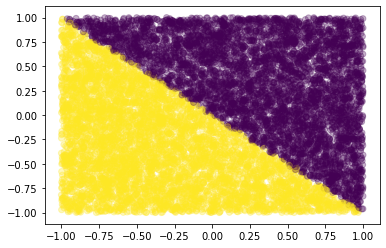

In [25]:
train_df, test_df = 
dataframes_simple[3]
plt.scatter(train_df['x'], train_df['y'], c=train_df['cls'],cmap=plt.cm.viridis, alpha=.3)
plt.show()

In [26]:
len(train_df)

10000

## Define network architectures

In [51]:
def create_networks(seed):
    input_size = 2
    output_size = 1

    networks = []

    # No hidden layer, no bias
    layers = [(output_size, SigmoidActivation(), False)]

    networks.append(Network(input_size, layers, LogError(), seed))

    # No hidden layer with bias
    layers = [(output_size, SigmoidActivation(), True)]

    networks.append(Network(input_size, layers, LogError(), seed))

    # With hidden sigmoid layer, 2 neurons
    layers = [(2, SigmoidActivation(), True),
              (output_size, SigmoidActivation(), True)]

    networks.append(Network(input_size, layers, LogError(), seed))

    return networks

## Simple dataset (100)

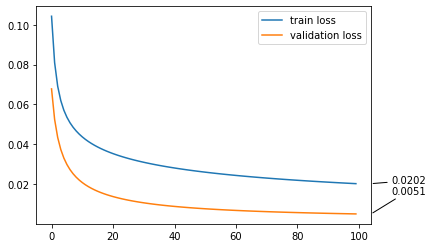

<Figure size 432x288 with 0 Axes>

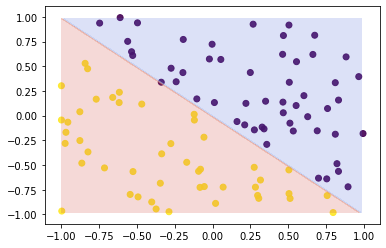

In [53]:
# 100
train_df, test_df = dataframes_simple[0]
network = create_networks(1234)[0]
train_losses, validation_losses = utils.train_classification(network, train_df, 100, 0.3, 5)
utils.plot_loss(train_losses, validation_losses)
utils.plot_decision_boundary(network, test_df)

### No bias

In [54]:
# 100
N = 30
train_df, test_df = dataframes_simple[0]
acc = np.zeros((N,1))
for i in range(N):
    network = create_networks(np.random.randint(0,1000))[0]
    utils.train_classification(network, train_df, 50, 0.3, 5)
    acc[i] = utils.calculate_accuacy(network, test_df)
print(acc.mean(axis=0), acc.std(axis=0))

[0.99266667] [0.0081377]


### Add bias

In [26]:
# 100
train_df, test_df = dataframes_simple[0]
N = 30
acc = np.zeros((N,1))
for i in range(N):
    network = create_networks(np.random.randint(0,1000))[1]
    utils.train_classification(network, train_df, 50, 0.3, 5)
    acc[i] = utils.calculate_accuacy(network, test_df)
print(acc.mean(axis=0), acc.std(axis=0))

[0.99433333] [0.00715697]


## Simple dataset (1000)

In [27]:
# 100
train_df, test_df = dataframes_simple[2]
N = 30
acc = np.zeros((N,1))
for i in range(N):
    network = create_networks(np.random.randint(0,1000))[1]
    utils.train_classification(network, train_df, 50, 0.3, 5)
    acc[i] = utils.calculate_accuacy(network, test_df)
print(acc.mean(axis=0), acc.std(axis=0))

[0.9947] [0.00175404]


# Three Gauss

In [4]:
def create_networks(seed):
    input_size = 2
    output_size = 3

    networks = []

    # No hidden layer, no bias
    layers = [(output_size, SigmoidActivation(), False)]

    networks.append(Network(input_size, layers, LogError(), seed))

    # No hidden layer with bias
    layers = [(output_size, SigmoidActivation(), True)]

    networks.append(Network(input_size, layers, LogError(), seed))

    # With hidden sigmoid layer, 2 neurons
    layers = [(2, SigmoidActivation(), True),
              (output_size, SigmoidActivation(), True)]

    networks.append(Network(input_size, layers, LogError(), seed))

    # With hidden sigmoid layer, 4 neurons
    layers = [(4, SigmoidActivation(), True),
              (output_size, SigmoidActivation(), True)]

    networks.append(Network(input_size, layers, LogError(), seed))

    # With 2 hidden Sigmoid layers, 4, 8 neurons
    layers = [(4, SigmoidActivation(), True),
              (8, SigmoidActivation(), True),
              (output_size, SigmoidActivation(), True)]

    networks.append(Network(input_size, layers, LogError(), seed))

    # With 2 hidden Relu layers, 4, 8 neurons
    layers = [(4, ReLUActivation(), True),
              (8, ReLUActivation(), True),
              (output_size, SigmoidActivation(), True)]

    networks.append(Network(input_size, layers, LogError(), seed))

    # With 4 hidden Relu layers
    layers = [(8, ReLUActivation(), True),
              (8, ReLUActivation(), True),
              (8, ReLUActivation(), True),
              (8, ReLUActivation(), True),
              (output_size, SigmoidActivation(), True)]
    
    networks.append(Network(input_size, layers, LogError(), seed))

    # With 4 hidden Relu layers
    layers = [(16, ReLUActivation(), True),
              (8, ReLUActivation(), True),
              (4, ReLUActivation(), True),
              (output_size, SigmoidActivation(), True)]

    networks.append(Network(input_size, layers, LogError(), seed))

    return networks

In [5]:
sizes = ['100', '500', '1000', '10000']
datasets_gauss = [('data.three_gauss.train.' + size + '.csv', 
                    'data.three_gauss.test.' + size + '.csv') for size in sizes]
datasets_gauss

[('data.three_gauss.train.100.csv', 'data.three_gauss.test.100.csv'),
 ('data.three_gauss.train.500.csv', 'data.three_gauss.test.500.csv'),
 ('data.three_gauss.train.1000.csv', 'data.three_gauss.test.1000.csv'),
 ('data.three_gauss.train.10000.csv', 'data.three_gauss.test.10000.csv')]

In [6]:
dataframes_gauss = [(pd.read_csv('../data/classification/'+name[0]), 
                      pd.read_csv('../data/classification/'+name[1])) for name in datasets_gauss]


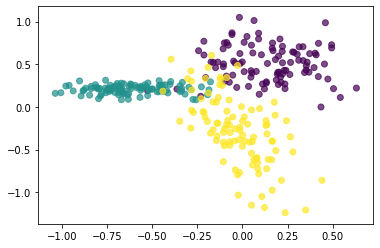

In [6]:
train_df, test_df = dataframes_gauss[0]
plt.scatter(train_df['x'], train_df['y'], c=train_df['cls'],cmap=plt.cm.viridis, alpha=.7)
plt.show()

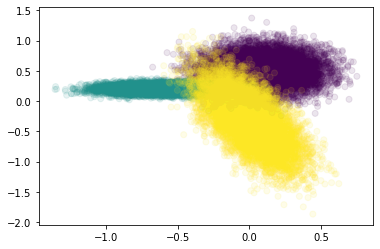

In [63]:
train_df, test_df = dataframes_gauss[3]
plt.scatter(train_df['x'], train_df['y'], c=train_df['cls'],cmap=plt.cm.viridis, alpha=.1)
plt.show()

In [8]:
df_min, df_max = utils.get_normalisation_scale(train_df)
n_train_df = utils.normalized_dataset(train_df, df_min, df_max)
n_test_df = utils.normalized_dataset(test_df, df_min, df_max)

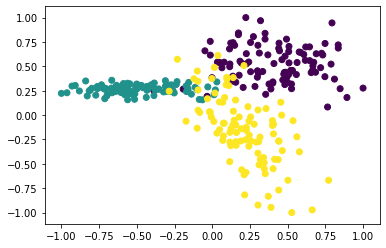

In [10]:
plt.scatter(n_train_df['x'], n_train_df['y'], c=n_train_df['cls'],cmap=plt.cm.viridis)
plt.show()

## Three gauss dataset (100)

### Dataset normalization

In [7]:
normalization_scales = []
for train_df, test_df in dataframes_gauss:
    df_min, df_max = utils.get_normalisation_scale(train_df)
    normalization_scales.append((df_min, df_max))
    train_df = utils.normalized_dataset(train_df, df_min, df_max)
    test_df = utils.normalized_dataset(test_df, df_min, df_max)

### First classifier

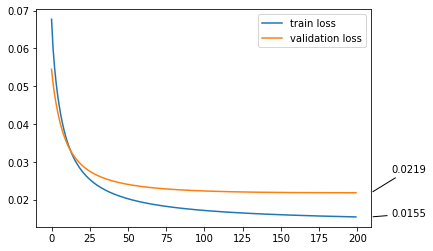

<Figure size 432x288 with 0 Axes>

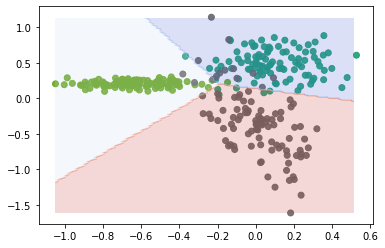

Network([Layer((2, 3), bias=True, <SigmoidActivation>)], <LogError>)
0.93


In [32]:
train_df, test_df = dataframes_gauss[0]
network = create_networks(100)[1]
train_losses, validation_losses = utils.train_classification(network, train_df, 200, 0.3, 10, multiclass=True)
utils.plot_loss(train_losses, validation_losses)
utils.plot_decision_boundary(network, test_df)
print(utils.calculate_accuacy(network, test_df, multiclass=True))

In [33]:
# 100
train_df, test_df = dataframes_gauss[0]
N = 30
acc = np.zeros((N,1))
for i in range(N):
    network = create_networks(np.random.randint(0,1000))[1]
    utils.train_classification(network, train_df, 100, 0.3, 10, multiclass=True)
    acc[i] = utils.calculate_accuacy(network, test_df, multiclass=True)
print(acc.mean(axis=0), acc.std(axis=0))

[0.92855556] [0.00267822]


(3, 5)
(5, 4)
[(3, 5), (5, 4)] [3, 5, 3]


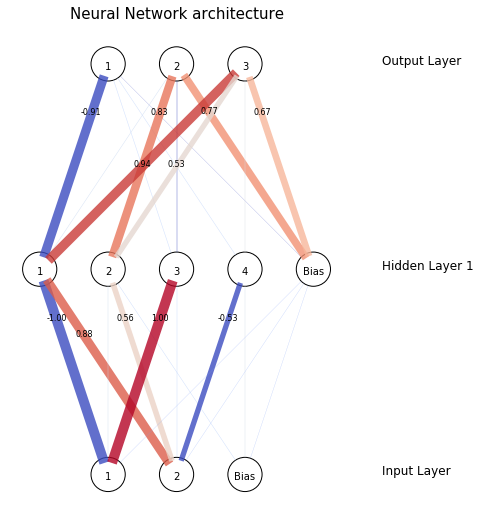

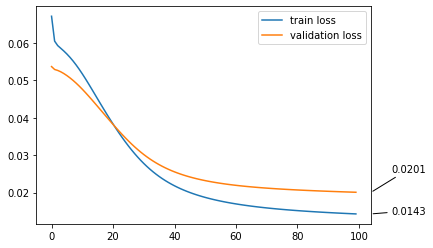

<Figure size 432x288 with 0 Axes>

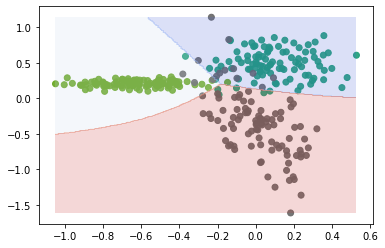

0.93
(3, 5)
(5, 4)
[(3, 5), (5, 4)] [3, 5, 3]


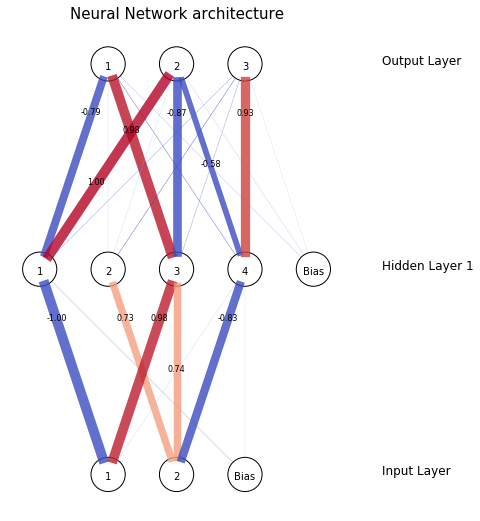

In [37]:
train_df, test_df = dataframes_gauss[0]
network = create_networks(100)[3]
utils.draw_weights(network)
train_losses, validation_losses = utils.train_classification(network, train_df, 100, 0.3, 10, multiclass=True)
utils.plot_loss(train_losses, validation_losses)
utils.plot_decision_boundary(network, test_df, h=.01)
print(utils.calculate_accuacy(network, train_df, multiclass=True))
utils.draw_weights(network)

In [38]:
# 100
train_df, test_df = dataframes_gauss[0]
N = 30
acc = np.zeros((N,1))
for i in range(N):
    network = create_networks(np.random.randint(0,1000))[2]
    utils.train_classification(network, train_df, 100, 0.3, 10, multiclass=True)
    acc[i] = utils.calculate_accuacy(network, test_df, multiclass=True)
print(acc.mean(axis=0), acc.std(axis=0))

[0.92888889] [0.00388094]


### 1000 elem set

In [18]:
# 100
train_df, test_df = dataframes_gauss[2]
N = 5
acc = np.zeros((N,1))
for i in range(N):
    network = create_networks(np.random.randint(0,1000))[1]
    utils.train_classification(network, train_df, 50, 0.3, 10, multiclass=True)
    acc[i] = utils.calculate_accuacy(network, test_df, multiclass=True)
print(acc.mean(axis=0), acc.std(axis=0))

[0.92813333] [0.00088443]


In [19]:
# 100
train_df, test_df = dataframes_gauss[2]
N = 5
acc = np.zeros((N,1))
for i in range(N):
    network = create_networks(np.random.randint(0,1000))[2]
    utils.train_classification(network, train_df, 50, 0.3, 10, multiclass=True)
    acc[i] = utils.calculate_accuacy(network, test_df, multiclass=True)
print(acc.mean(axis=0), acc.std(axis=0))

[0.92366667] [0.00168655]


### New arch

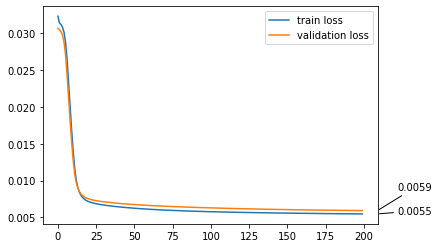

<Figure size 432x288 with 0 Axes>

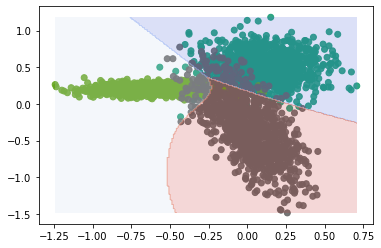

0.9263333333333333


In [17]:
train_df, test_df = dataframes_gauss[2]
network = create_networks(1234)[4]
train_losses, validation_losses = utils.train_classification(network, train_df, 200, 0.3, 20, multiclass=True)
utils.plot_loss(train_losses, validation_losses)
utils.plot_decision_boundary(network, test_df, h=.01)
print(utils.calculate_accuacy(network, test_df, multiclass=True))

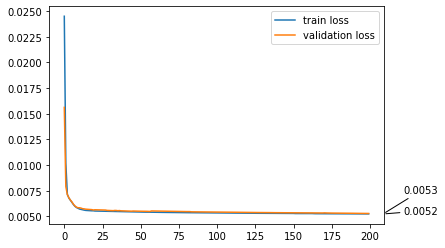

<Figure size 432x288 with 0 Axes>

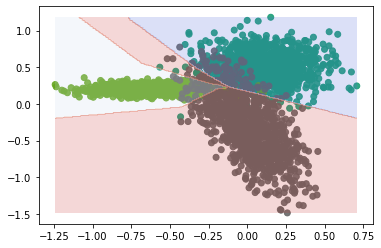

0.936


In [16]:
train_df, test_df = dataframes_gauss[2]
network = create_networks(1234)[5]
train_losses, validation_losses = utils.train_classification(network, train_df, 200, 0.3, 20, multiclass=True)
utils.plot_loss(train_losses, validation_losses)
utils.plot_decision_boundary(network, test_df, h=.01)
print(utils.calculate_accuacy(network, test_df, multiclass=True))

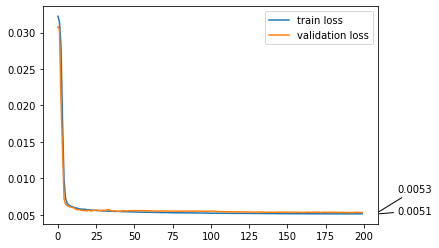

<Figure size 432x288 with 0 Axes>

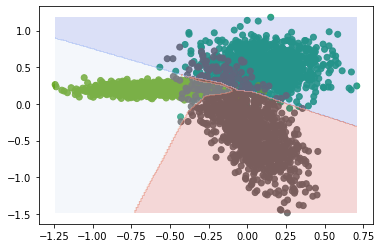

0.934


In [15]:
train_df, test_df = dataframes_gauss[2]
network = create_networks(1234)[6]
train_losses, validation_losses = utils.train_classification(network, train_df, 200, 0.3, 20, multiclass=True)
utils.plot_loss(train_losses, validation_losses)
utils.plot_decision_boundary(network, test_df, h=.01)
print(utils.calculate_accuacy(network, test_df, multiclass=True))

In [8]:
# K4
train_df, test_df = dataframes_gauss[2]
N = 5
acc = np.zeros((N,1))
for i in range(N):
    network = create_networks(np.random.randint(0,1000))[4]
    utils.train_classification(network, train_df, 50, 0.3, 10, multiclass=True)
    acc[i] = utils.calculate_accuacy(network, test_df, multiclass=True)
print(acc.mean(axis=0), acc.std(axis=0))

[0.92793333] [0.00057349]


In [9]:
# K5
train_df, test_df = dataframes_gauss[2]
N = 5
acc = np.zeros((N,1))
for i in range(N):
    network = create_networks(np.random.randint(0,1000))[5]
    utils.train_classification(network, train_df, 50, 0.3, 10, multiclass=True)
    acc[i] = utils.calculate_accuacy(network, test_df, multiclass=True)
print(acc.mean(axis=0), acc.std(axis=0))

[0.9312] [0.00344222]


In [13]:
# K6
train_df, test_df = dataframes_gauss[2]
N = 5
acc = np.zeros((N,1))
for i in range(N):
    network = create_networks(np.random.randint(0,1000))[6]
    utils.train_classification(network, train_df, 50, 0.3, 10, multiclass=True)
    acc[i] = utils.calculate_accuacy(network, test_df, multiclass=True)
print(acc.mean(axis=0), acc.std(axis=0))

[0.93086667] [0.00526456]


In [ ]:
network = create_networks(np.random.randint(0,1000))[2]
utils.train_classification(network, train_df, 50, 0.3, 10, multiclass=True)

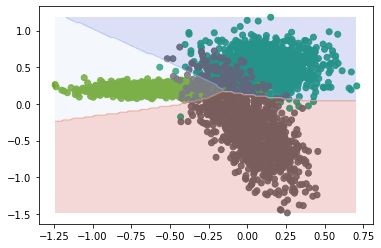

In [11]:
utils.plot_decision_boundary(network, test_df)

(3, 3)
(3, 4)
[(3, 3), (3, 4)] [3, 3, 3]


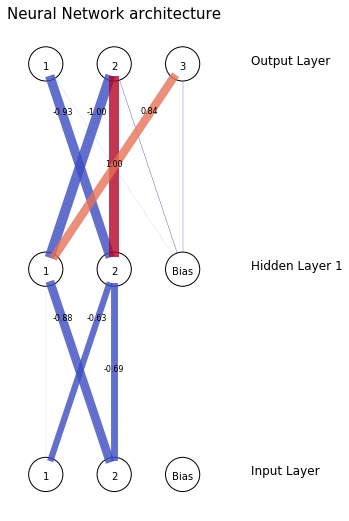

In [12]:
utils.draw_weights(network)